# Transform collected YouTube Files to Trainingsdata
We want to use two kinds of trainingdata. First we want to split every song in junks of 0.25 seconds and use them as trainingsdata to generate new junks. These junks get sorted in a 128 dimensional field by our autoencoder. The structure of a song can then be imagined as a movement trough the 128 dimensional field. We will store these "movements", i.e. a list of coordinates and use these lists as trainingsdata for another machine learning algorithm. Finally we want to be able to generate new "movements", i.e. new sequences of junks on the one hand and the corresponding junks themselves on the other hand.

## Snippets
Every track from the training data gets split in snippets with a duration of 0.25 second. The last snippets gets filled up with silence, so that every snippets is exactly 0.25 seconds (=11025 Samples).

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import librosa
import librosa.display
import librosa.feature.inverse
import soundfile
from IPython.display import display, Audio
import math
import os
import time

### Snippet class
We split each song in multiple snippets and create spectograms of them.
To train the autoencoder all spectograms have to be of the same size and have an even number of time-windows (frames). We will also normalize the spectograms, so that all values are between 0 and 1. But as we apply the same normalization on all snippets of all songs, we do not lose information about the loudness. 

As we want to be able to reconstruct a song based on a collection of snippets later, we also implement appropriate methods for this task in this class. To avoid clicks in the audio stream, it'll be important that each snippet starts and ends with a zero-crossing. We will cut the snippets on the first and on the last zero-crossing. 


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import librosa
import librosa.display
import librosa.feature.inverse
import soundfile
from IPython.display import display, Audio
import math
import os


class Snippets:
    def __init__(self, file_path, min_size_fraction, win_length, n_fft, hop_length):
        self.data, self.sr = librosa.load(file_path, sr=None, mono=True)
        self.min_size = self.sr / min_size_fraction
        self.split_points = []
        self.win_length = win_length
        self.n_fft = n_fft
        self.hop_length = hop_length

    def _delete_silence(self, pcm, min_size):
        new_pcm = []
        for i in range(0, len(pcm), min_size):
            frame = pcm[i:i + min_size]
            rms = math.sqrt(sum(frame ** 2)) / len(frame)
            if rms > 0.00001:
                new_pcm.append(frame)
        return np.array(new_pcm).flatten()

    def get_snippet_spectos(self):
        self.data = self._delete_silence(self.data, 2 * self.sr)
        if len(self.data) > self.min_size:
            self._get_splitPoints()
            snippets = self._generate_snippets()
            spectos = self._get_mel_spectos(snippets)
            normalized_spectos = self._normalise(np.asarray(spectos), 0, 1, -100, 100)
            return normalized_spectos
        else:
            return None

    def _get_splitPoints(self):
        for i in range(int(len(self.data) / self.min_size)):
            self.split_points.append(int((i + 1) * self.min_size))
        self.split_points = np.asarray(self.split_points)

    def _generate_snippets(self):
        snippets = []
        start = 0

        for split_point in self.split_points:
            end = split_point
            snippet = self.data[start:end]
            start = end
            if type(snippet) is np.ndarray:
                snippets.append(snippet)

        last_snippet = self.data[start:]
        last_snippet = self._apply_padding(last_snippet, self.min_size)
        if type(last_snippet) is np.ndarray:
            snippets.append(last_snippet)
        return snippets

    def _apply_padding(self, snippet, max_length):
        missing_vals = max_length - snippet.shape[0]
        if missing_vals > 0:
            snippet = np.pad(snippet, (0, int(missing_vals)), 'constant', constant_values=(0, 0))
        return snippet

    def _get_mel_spectos(self, snippets):
        spectograms = []
        for snippet in snippets:
            mel = librosa.feature.melspectrogram(y=snippet, sr=self.sr, hop_length=self.hop_length,
                                                 win_length=self.win_length, n_fft=self.n_fft, n_mels=128, fmax=16000)
            spectogram = librosa.power_to_db(mel)
            spectogram = spectogram[..., np.newaxis]
            spectograms.append(spectogram)
        return spectograms

    @staticmethod
    def _normalise(array, new_min, new_max, old_min, old_max):
        norm_array = (array - old_min) / (old_max - old_min)
        norm_array = norm_array * (new_max - new_min) + new_min
        return norm_array

    def plot_snippets(self, plot_range=[0, 44100 * 4]):
        data_range = self.data[plot_range[0]:plot_range[1]]
        plt.figure(figsize=(15, 5))
        plt.plot(data_range)
        plt.hlines(0.0, plot_range[0], plot_range[1], color='r')
        plt.vlines(
            self.split_points[np.argwhere((self.split_points > plot_range[0]) & (self.split_points < plot_range[1]))],
            data_range.max(), data_range.min(), color='g')
        plt.xlabel("samples")
        plt.ylabel("amplitude")
        plt.title("Snippets")
        plt.show();

    """
    --------------
    RECONSTRUCTION
    --------------
    """

    @classmethod
    def specto_to_pcm(cls, model, data, hop_length, n_fft, win_length):
        latent_representation = model.encoder.predict(data)
        reconstructed_pcm, reconstructed_specto = cls.latent_representation_to_pcm(
            latent_representations=latent_representation,
            model=model,
            hop_length=hop_length,
            n_fft=n_fft,
            win_length=win_length)
        print(reconstructed_pcm.shape)
        return reconstructed_pcm, reconstructed_specto

    @classmethod
    def latent_representation_to_pcm(cls, latent_representations, model, hop_length, n_fft, win_length):
        reconstructed_specto = model.decoder.predict(latent_representations)
        reconstructed_pcm, _ = cls.reconstructed_spectos_to_pcm(reconstructed_specto, hop_length, n_fft, win_length)
        return reconstructed_pcm, reconstructed_specto

    @classmethod
    def reconstructed_spectos_to_pcm(cls, spectos, hop_length, n_fft, win_length):
        reconstructed_data = np.array(0)
        clipped_spectos = []
        for i, specto in enumerate(spectos):
            reshaped_specto = specto[:, :, 0]
            denorm_specto = cls._denormalise(reshaped_specto, 0, 1, -100, 100)
            clipped_specto = np.clip(denorm_specto, -100, 20)
            # print(clipped_specto.max())
            lin_specto = librosa.db_to_power(clipped_specto)
            pcm = librosa.feature.inverse.mel_to_audio(lin_specto, sr=44100,
                                                       hop_length=hop_length,
                                                       n_fft=n_fft,
                                                       win_length=win_length,
                                                       fmax=16000)
            signal = cls._cut_zero_crossings(pcm)
            
            if i > 0:
                reconstructed_data = cls._crossfade(reconstructed_data, signal, 820)
            else:
                reconstructed_data = np.append(reconstructed_data, signal)
            clipped_spectos.append(clipped_specto)
            print(f"Reconstructed {i + 1} of {len(spectos)} spectos", end="\r")
        reconstructed_data = reconstructed_data.flatten()
        return reconstructed_data, clipped_spectos

    @staticmethod
    def _denormalise(array, current_min, current_max, original_min, original_max):
        denorm_array = (array - current_min) / (current_max - current_min)
        denorm_array = denorm_array * (original_max - original_min) + original_min
        return denorm_array

    @staticmethod
    def _cut_zero_crossings(pcm):
        zero_crossings = np.argwhere(
            (np.sign(pcm[:-1]) == -1) & (np.sign(pcm[1:]) == 1)
        )
        if (zero_crossings.shape[0] > 0):
            last_zero = zero_crossings[-1][0]
            first_zero = zero_crossings[0][0]
            cutted_pcm = pcm[first_zero:last_zero]
            return cutted_pcm
        else:
            return pcm

    @staticmethod
    def _crossfade(array_a, array_b, fadeTime):
        fade_in = np.sqrt((1 + np.linspace(-1, 1, fadeTime)) * 0.5)
        fade_out = np.sqrt((1 - np.linspace(-1, 1, fadeTime)) * 0.5)
        fade_in = np.pad(fade_in, (0, array_b.shape[0] - fadeTime), 'constant', constant_values=(1, 1))
        fade_out = np.pad(fade_out, (array_a.shape[0] - fadeTime, 0), 'constant', constant_values=(1, 1))
        array_a = array_a * fade_out
        array_b = array_b * fade_in
        array_a[-fadeTime:] += array_b[:fadeTime]
        result = np.append(array_a, array_b[fadeTime:])
        return result

    @classmethod
    def plot_specto(cls, specto, name, hop_length):
        print("\n" + name + "\n")
        librosa.display.specshow(
            specto[0].reshape(specto[0].shape[0], specto[0].shape[1]),
            x_axis='time',
            y_axis='mel',
            sr=44100,
            fmax=16000,
            hop_length=hop_length,
        )
        plt.colorbar()
        plt.show()


### Generate Snippets
We can now generate all the snippets of all songs.

In [3]:
MIN_SIZE_FRACTION = 0.5
WIN_LENGTH = 690*2
HOP_LENGTH = 690
N_FFT = 690*2

folder_path = 'demo_data\\stems'
paths = librosa.util.find_files(folder_path, ext=['wav'])


num = 500
all_snippets = [] # this variable stores all snippets of all songs, and can therefor fill quite a huge amount of RAM depending on the training data
num_of_snippets_per_song = []
paths = paths[num-500:num]

for i,path in enumerate(paths):
    snippet_generator = Snippets(path, MIN_SIZE_FRACTION, WIN_LENGTH, N_FFT, HOP_LENGTH)
    spectos = snippet_generator.get_snippet_spectos() # This is a list of snippet-spectograms of the current song
    if not spectos is None:
        all_snippets.extend(list(spectos))  # This is a list of the snippet-spectograms of all songs
        num_of_snippets_per_song.append(len(spectos)) # This is a list of the number of snippets each song has
    print(f"{i+1} of {len(paths)} songs done." + f" Currently working on file:{path}", end='\r')
    
    # if (i % 50 == 0) and (i>0):
    #     save_folder = "data_and_models\\" + str((1/MIN_SIZE_FRACTION)) + "_" + str(all_snippets[0].shape[1])
    #     save_path = save_folder + "\\spectos_2" + str(i) + ".npy"
    #     np.save(save_path,np.asarray(all_snippets))
    #     print("\n Saved at " + save_folder)

C:\Users\pitma\AppData\Local\Temp\ipykernel_12872\2661954349.py:29: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(new_pcm).flatten()


We can look at the cutting points of the first 32 seconds of our last song:

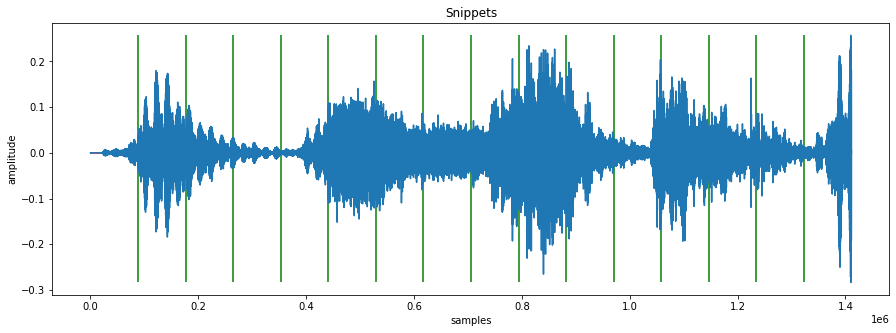

In [4]:
snippet_generator.plot_snippets(plot_range=[0, 44100*32])

In [5]:
print(f"We've extracted {len(all_snippets)} snippets out of {len(paths)} songs.")

We've extracted 56861 snippets out of 500 songs.


We can double check, that all snippets have the same shape:

In [6]:
error = 0
for i,snippet in enumerate(all_snippets):
    if not (snippet.shape == all_snippets[0].shape):
        error = 1
        print("Something went wrong!")
        print(f"{snippet.shape[0] - all_snippets[0].shape[0]} in dim 0 and {snippet.shape[1]- all_snippets[1].shape[1]} in dim 1")
        print(f"Error occured in waveset {i}")
if error == 0:
    print(f"All snippets have the same shape: {all_snippets[0].shape}")

All snippets have the same shape: (128, 128, 1)


We can look at the spectogram of a random snippet to see that everything works.

D:\Daten\Studium\Semester_7\MusikInfo\MetaHuman\venv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
D:\Daten\Studium\Semester_7\MusikInfo\MetaHuman\venv\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


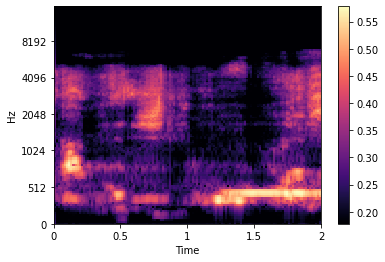

In [7]:
librosa.display.specshow(
    all_snippets[np.random.randint(0,len(all_snippets))].reshape(all_snippets[0].shape[0],all_snippets[0].shape[1]),
    x_axis='time',
    y_axis='mel',
    sr=44100,
    fmax=16000,
    hop_length=HOP_LENGTH,
)
plt.colorbar()
plt.show()

We use mel spectograms. The frequency axis is not linear, but divided into unequal parts, that resemble the human hearing. These are the filters that are applied
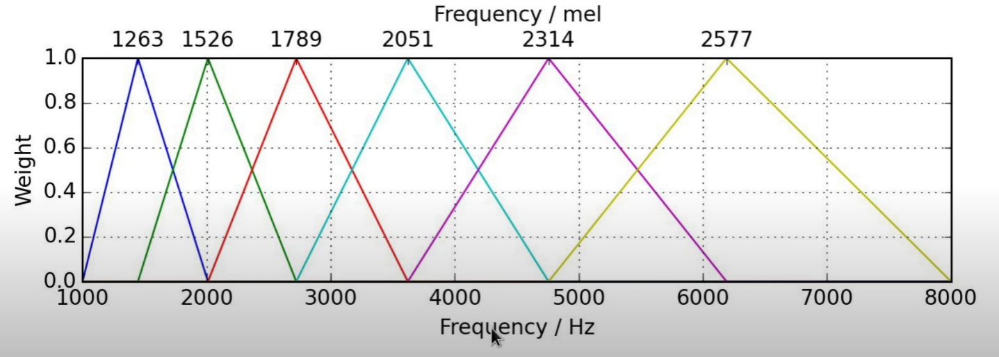


### Create Song-Label for Snippets
For demonstration purposes we want to store to which song a snippet belongs

In [8]:
save_folder = "data_and_models\\" + str((1/4)) + "_" + str(16)


In [9]:
song_labels = np.empty(len(all_snippets))

start = 0
stop = 0

for i, num_of_snippets in enumerate(num_of_snippets_per_song):
    stop += num_of_snippets
    song_labels[start : stop] = i
    start += num_of_snippets    

### Create Position-Labels for Snippets
We also want to know, at which position in the song a snippet occured. For this we split the song in 10 parts and create a label 0, 1, 2 ... 9 for each waveset.

In [10]:
song_parts = 10
position_labels = []
for num_of_snippets in num_of_snippets_per_song:
    position_labels.extend(list(np.linspace(0,song_parts+1, num=num_of_snippets, dtype=np.int64)))


### Save Data
We save the data on disk for later use.

In [11]:
save_folder = "data_and_models\\" + str((1/MIN_SIZE_FRACTION)) + "_" + str(all_snippets[0].shape[1])

if not os.path.exists(save_folder):
    os.makedirs(save_folder)

In [16]:

save_path = save_folder + "\\spectos" + str(num) + ".npy"
np.save(save_path,np.asarray(all_snippets))

save_path2 = save_folder + "\\song_labels" + str(num) + ".npy"
np.save(save_path2, song_labels)

save_path3 = save_folder + "\\position_labels" + str(num) +  ".npy"
np.save(save_path3, position_labels)

save_path4 = save_folder + "\\SnippetNum" + str(num) + ".npy"
np.save(save_path4, num_of_snippets_per_song)


## Test the conversion
To see how much of the audio data gets lost in the process of creating the snippets we can try to reconstruct a song from the generated spectograms. Most information gets lost, because we create a magnitude spectogram and drop the phase information.

In [13]:
song_num = 0
indices = np.argwhere(song_labels == song_num)

original_song, _ = librosa.load(paths[song_num],sr=44100, mono=True)


last_time = time.time()
song_spectos = all_snippets[indices[0][0]:indices[-1][0]]
song_spectos = song_spectos[(30):(35)]
reconstructed_song,_ = Snippets.reconstructed_spectos_to_pcm(song_spectos,HOP_LENGTH, N_FFT, WIN_LENGTH)
print("Took: " + str(time.time() -last_time) + " seconds")

Took: 15.264434576034546 seconds


In [14]:
print("This is the original Song.")
display(Audio(original_song, rate=44100))

This is the original Song.


In [15]:
print("This is the reconstructed Song. The phase information is missing")
display(Audio(reconstructed_song, rate=44100))

This is the reconstructed Song. The phase information is missing
